# 1.查看種類

In [ ]:
# 1. 下載資料集
!pip install roboflow
from roboflow import Roboflow
import yaml

# --- API Key ---
rf = Roboflow(api_key="xryhmufbEEfAppAMcTX8")
project = rf.workspace("fooddetector-xnrdr").project("twfooddetection-rx7pe")
version = project.version(4)
dataset = version.download("yolov5")

# 2. 讀取並顯示目前的分類
print("\n" + "="*30)
print(" 正在檢查資料集裡的分類...")
yaml_path = f"{dataset.location}/data.yaml"

with open(yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)

old_classes = data_config['names']
print(f"共有 {len(old_classes)} 種分類：")
print("-" * 20)
for i, name in enumerate(old_classes):
    print(f"ID {i}: {name}")
print("="*30)
print(" 請看上面列出的名字，決定哪些要合併成 'Meat', 'Rice', 'Veg'。")

loading Roboflow workspace...
loading Roboflow project...

 正在檢查資料集裡的分類...
共有 4 種分類：
--------------------
ID 0: Rice
ID 1: Meat
ID 2: Veg
ID 3: Side
 請看上面列出的名字，決定哪些要合併成 'Meat', 'Rice', 'Veg'。


# 2.查看種類&訓練

In [ ]:
!pip install roboflow
import os
import glob
import yaml
from tqdm.notebook import tqdm
from roboflow import Roboflow

# ==========================================
# 0. 載入資料集
# ==========================================
rf = Roboflow(api_key="xryhmufbEEfAppAMcTX8")
project = rf.workspace("fooddetector-xnrdr").project("twfooddetection-rx7pe")
version = project.version(4)
dataset = version.download("yolov5")

# ==========================================
# 設定你的合併規則
# ==========================================
# 修正說明：程式現在會自動忽略大小寫，所以這裡不管寫大寫或小寫都可以
class_mapping_rules = {
    # --- 優先比對的長字串 (避免包含關係誤判) ---
    "sweet potato leaves": "Veg", # 地瓜葉
    "chicken leg steak": "Meat",  # 雞腿排
    "three-cup chicken": "Meat",  # 三杯雞
    "brown swordbelt": "Meat",    # 白帶魚
    "steamed fish": "Meat",       # 蒸魚
    "fried dried beans": "Veg",   # 四季豆
    "fried onions": "Veg",        # 炒洋蔥
    "fushan-lettuce": "Veg",      # 福山萵苣
    "bitter gourd": "Veg",        # 苦瓜
    "dried radish omelette": "Side", # 菜脯蛋
    "scrambled eggs with carrots": "Side", # 紅蘿蔔炒蛋
    "scramble egg with tomatoes": "Side",  # 番茄炒蛋
    "steamed egg": "Side",        # 蒸蛋
    "braised egg": "Side",        # 滷蛋
    "mapo tofu": "Side",          # 麻婆豆腐
    "pan fried tofu": "Side",     # 煎豆腐
    "bean bag": "Side",           # 豆包
    "ants climbing the tree": "Side", # 螞蟻上樹

    # --- 飯類 (Rice) ---
    "purplerice": "Rice",
    "rice": "Rice",

    # --- 肉類 (Meat) ---
    "chicken": "Meat",
    "pork": "Meat",
    "beef": "Meat",
    "fish": "Meat",
    "meat": "Meat",

    # --- 青菜類 (Veg) ---
    "cabbage": "Veg",
    "broccoli": "Veg",
    "cauliflower": "Veg",
    "leafy_greens": "Veg",
    "eggplant": "Veg",            # 茄子 (必須在 egg 之前比對)
    "beans": "Veg",               # 豆類
    "vegetable": "Veg",

    # --- 配菜類 (Side) ---
    "tofu": "Side",
    "side_dish": "Side",
    "egg": "Side",                # egg 放最後，避免誤判 eggplant
}

# 定義新的類別順序
NEW_CLASSES = ["Rice", "Meat", "Veg", "Side"]

# ==========================================
# 資料集清洗與修改程式
# ==========================================

dataset_path = dataset.location
print(f"正在處理資料集路徑: {dataset_path}")

# 1. 建立 ID 對照表 (Old ID -> New ID)
with open(f"{dataset_path}/data.yaml", 'r') as f:
    old_data = yaml.safe_load(f)
old_names = old_data['names']

id_map = {}
print("\n建立轉換規則：")

for old_id, old_name in enumerate(old_names):
    found_new_class = None
    old_name_lower = old_name.lower().strip() # 轉小寫並去空白

    # 針對每一個規則進行比對
    for key_name, target_class in class_mapping_rules.items():
        # 把 key_name 也轉成小寫 (.lower())
        # 這樣 "Dried Radish Omelette" 就會變成 "dried radish omelette" 進行比對
        if key_name.lower() in old_name_lower:
            found_new_class = target_class
            break # 找到第一個符合的規則就停止，避免被後面的短詞蓋掉

    if found_new_class and found_new_class in NEW_CLASSES:
        new_id = NEW_CLASSES.index(found_new_class)
        id_map[old_id] = new_id
        print(f"  {old_name} ({old_id}) -> {found_new_class} ({new_id})")
    else:
        # 為了 debug，印出它為什麼失敗
        print(f"  {old_name} ({old_id}) -> 丟棄 (比對字串: '{old_name_lower}')")

# 2. 修改所有的標註檔 (.txt)
all_txt_files = glob.glob(f"{dataset_path}/**/*.txt", recursive=True)
txt_files = [f for f in all_txt_files if "README" not in os.path.basename(f)]

print(f"\n正在修改 {len(txt_files)} 個標註檔案...")

# 統計修改數量
changed_count = 0
dropped_count = 0

for txt_file in tqdm(txt_files):
    new_lines = []
    has_change = False

    with open(txt_file, 'r') as f:
        lines = f.readlines()
        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                try:
                    old_cls_id = int(parts[0])
                except ValueError:
                    continue

                if old_cls_id in id_map:
                    new_cls_id = id_map[old_cls_id]
                    parts[0] = str(new_cls_id)
                    new_lines.append(" ".join(parts) + "\n")
                    has_change = True
                else:
                    # 如果不在 map 中，表示這個物件被丟棄了 (例如背景或未定義的類別)
                    dropped_count += 1

    # 只有當檔案內容有變動或有刪減時才寫入
    if new_lines or has_change:
        with open(txt_file, 'w') as f:
            f.writelines(new_lines)
            changed_count += 1

# 3. 更新 data.yaml
new_yaml = {
    'path': dataset_path,
    'train': 'train/images',
    'val': 'valid/images',
    'test': 'test/images',
    'nc': len(NEW_CLASSES),
    'names': NEW_CLASSES
}

with open(f"{dataset_path}/data.yaml", 'w') as f:
    yaml.dump(new_yaml, f)

print(f"\n資料集清洗完成！")
print(f" - 修改了 {changed_count} 個檔案")
print(f" - 現在只有 Rice, Meat, Veg, Side 四種分類")

# 4. 開始訓練
print("\n開始訓練新模型...")
if not os.path.exists("yolov5"):
    !git clone https://github.com/ultralytics/yolov5
    %cd yolov5
    !pip install -r requirements.txt
else:
    %cd yolov5

# 訓練指令
!python train.py --img 640 --batch 16 --epochs 100 --data {dataset_path}/data.yaml --weights yolov5m.pt --cache

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to TwFoodDetection-4 in yolov5pytorch:: 100%|██████████| 1448/1448 [00:00<00:00, 6955.81it/s]

正在處理資料集路徑: /content/yolov5/TwFoodDetection-4

建立轉換規則：
  Ants climbing the tree (0) -> Side (3)
  Broccoli (1) -> Veg (2)
  Chicken Leg Steak (2) -> Meat (1)
  Dried Radish Omelette (3) -> Side (3)
  Fried dried beans (4) -> Veg (2)
  Fried onions (5) -> Veg (2)
  Fushan-lettuce (6) -> Veg (2)
  Fushan-lettuceStir-fried Sweet Beans with Oyster Mushrooms (7) -> Veg (2)
  Mapo Tofu (8) -> Side (3)
  Pan Fried Tofu (9) -> Side (3)
  Scramble Egg with Tomatoes (10) -> Side (3)
  Scrambled eggs with carrots (11) -> Side (3)
  Steamed fish (12) -> Meat (1)
  bean bag (13) -> Side (3)
  bitter gourd (14) -> Veg (2)
  braised egg (15) -> Side (3)
  brown swordbelt (16) -> Meat (1)
  cabbage (17) -> Veg (2)
  cauliflower (18) -> Veg (2)
  eggplant (19) -> Veg (2)
  meat (20) -> Meat (1)
  purplerice (21) -> Rice (0)
  rice (22) -> Rice (0)
  steamed egg (23) -> Side (3)
  sweet potato leaves (24) -> Veg (2)
  three-cup chicken (25) -> Meat (1)

正在修改 718 個標註檔案...


  0%|          | 0/718 [00:00<?, ?it/s]

串流輸出內容已截斷至最後 5000 行。
  with torch.cuda.amp.autocast(amp):
      42/99      7.79G    0.02394    0.01269    0.00133         46        640:  73% 30/41 [00:12<00:04,  2.52it/s]/content/yolov5/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      42/99      7.79G    0.02387    0.01266   0.001313         44        640:  76% 31/41 [00:12<00:03,  2.53it/s]/content/yolov5/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      42/99      7.79G    0.02382    0.01259   0.001364         43        640:  78% 32/41 [00:12<00:03,  2.54it/s]/content/yolov5/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      42/

# 3.測試自己的圖片

檢測到 YOLOv5 環境已存在。
開始執行預測 (使用 yolov5/detect.py)...
------------------------------
偵測完成！
結果已儲存於：runs/detect/exp
------------------------------

--- 預覽結果 (共 11 張) ---
[1] 592619072_25238136069175849_1837216100635389044_n.jpg


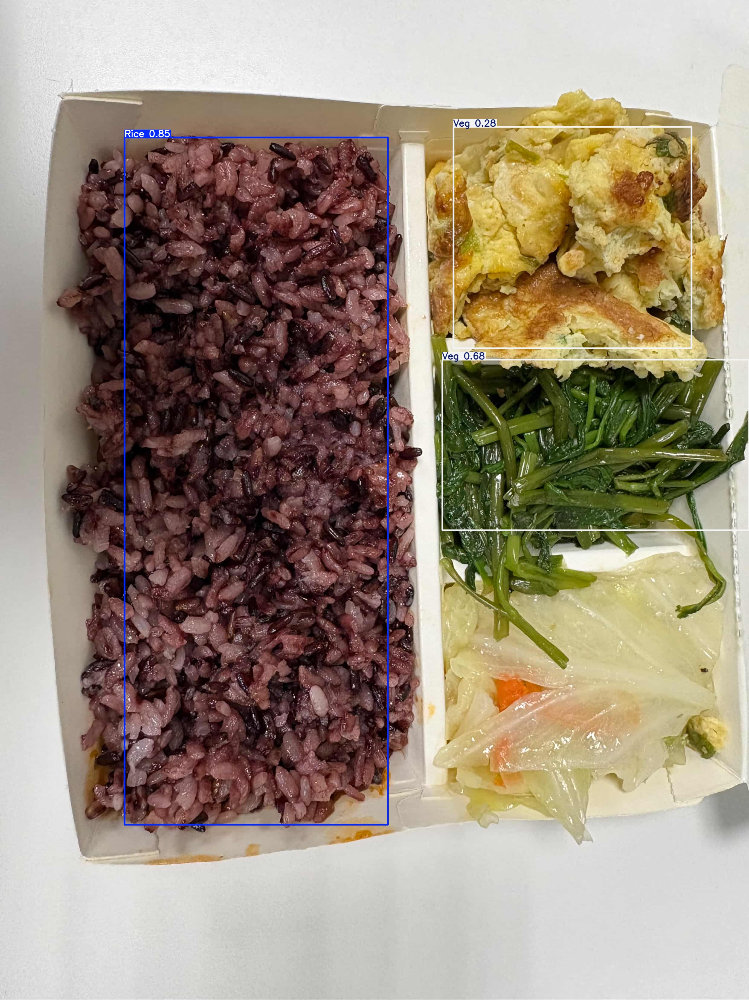

[2] 598644900_838522365755949_4278945036823418249_n.jpg


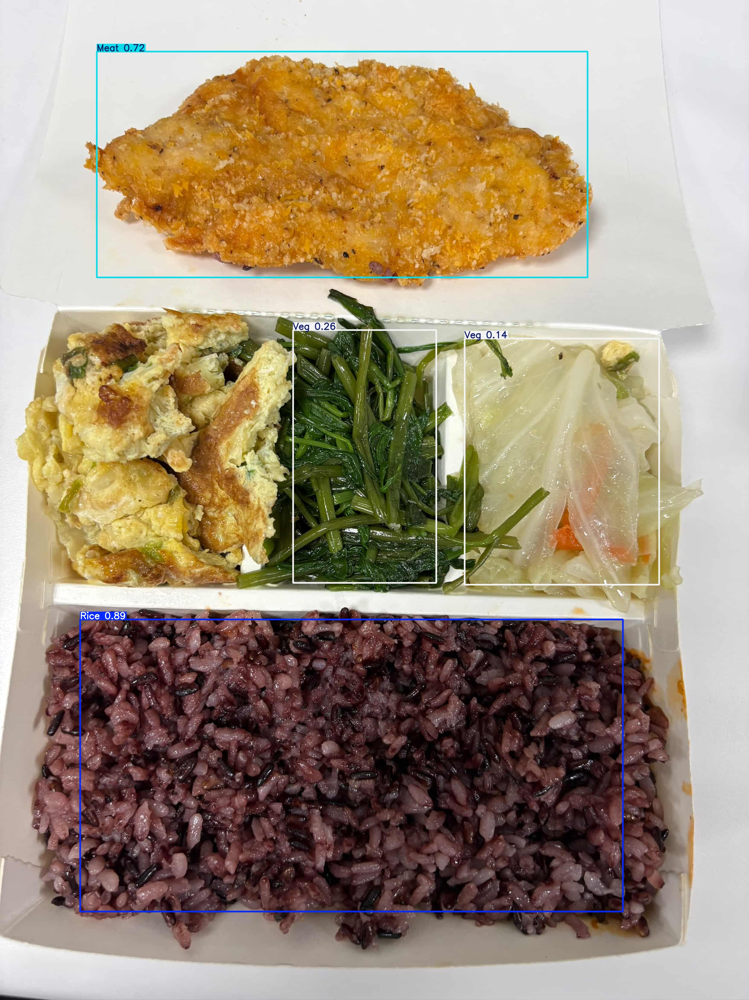

[3] a7.jpg


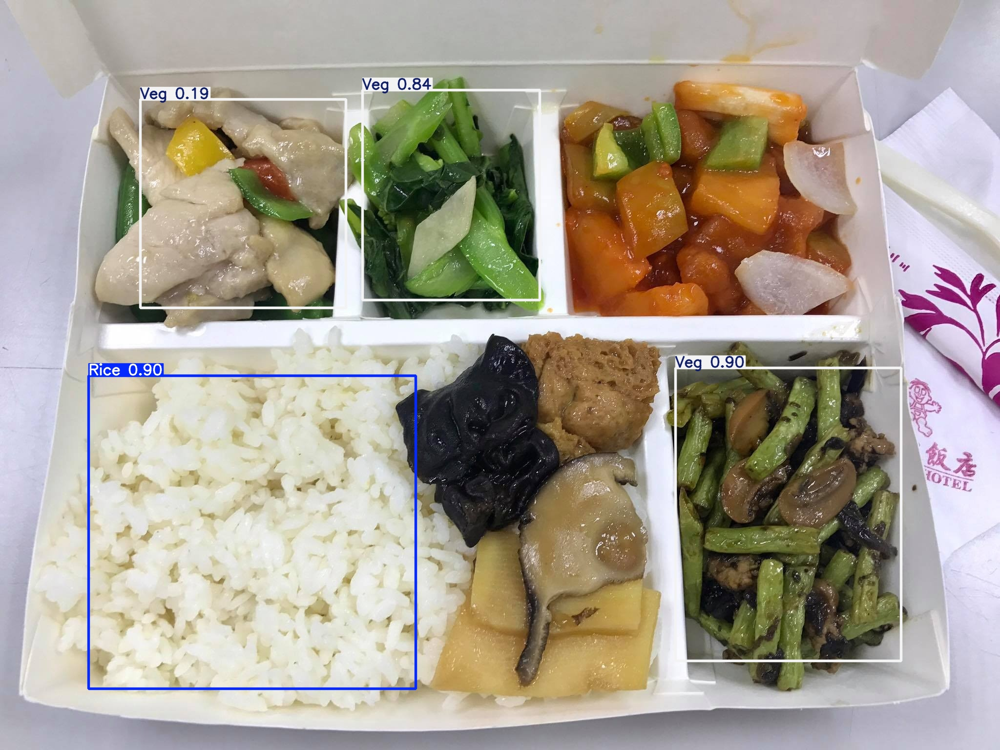

[4] a8.jpg


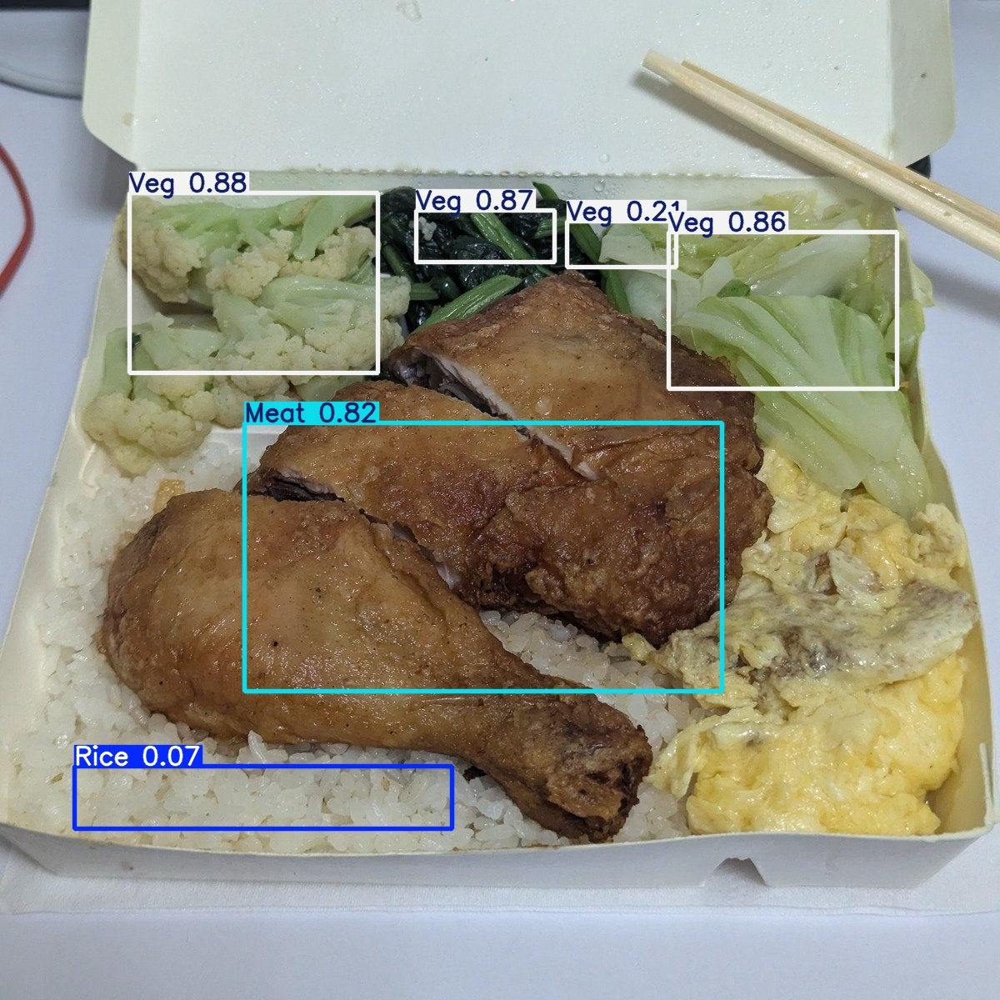

[5] a9.jpg


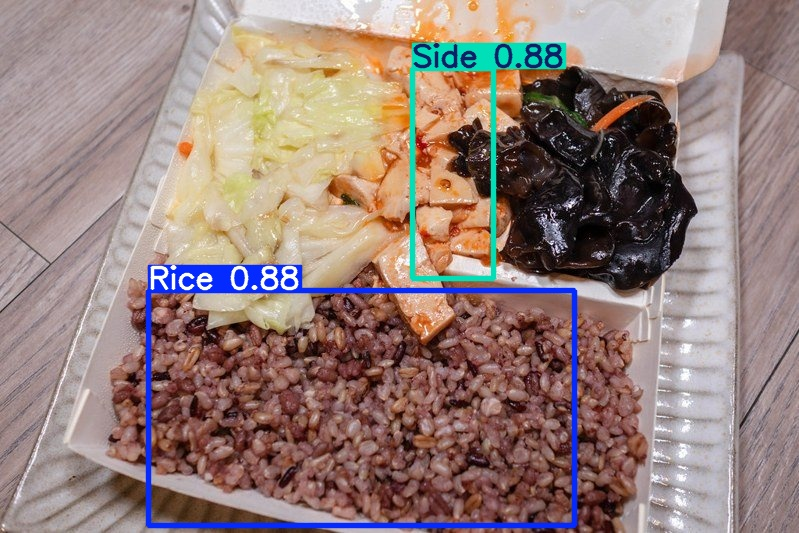

[6] food.jpg


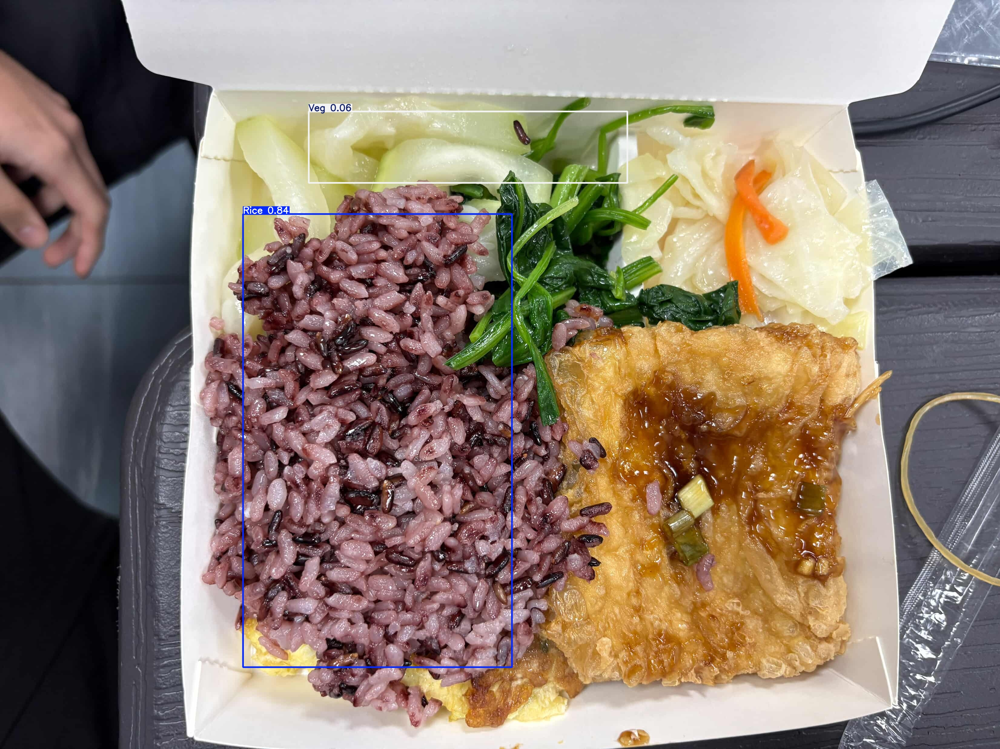

[7] food.png


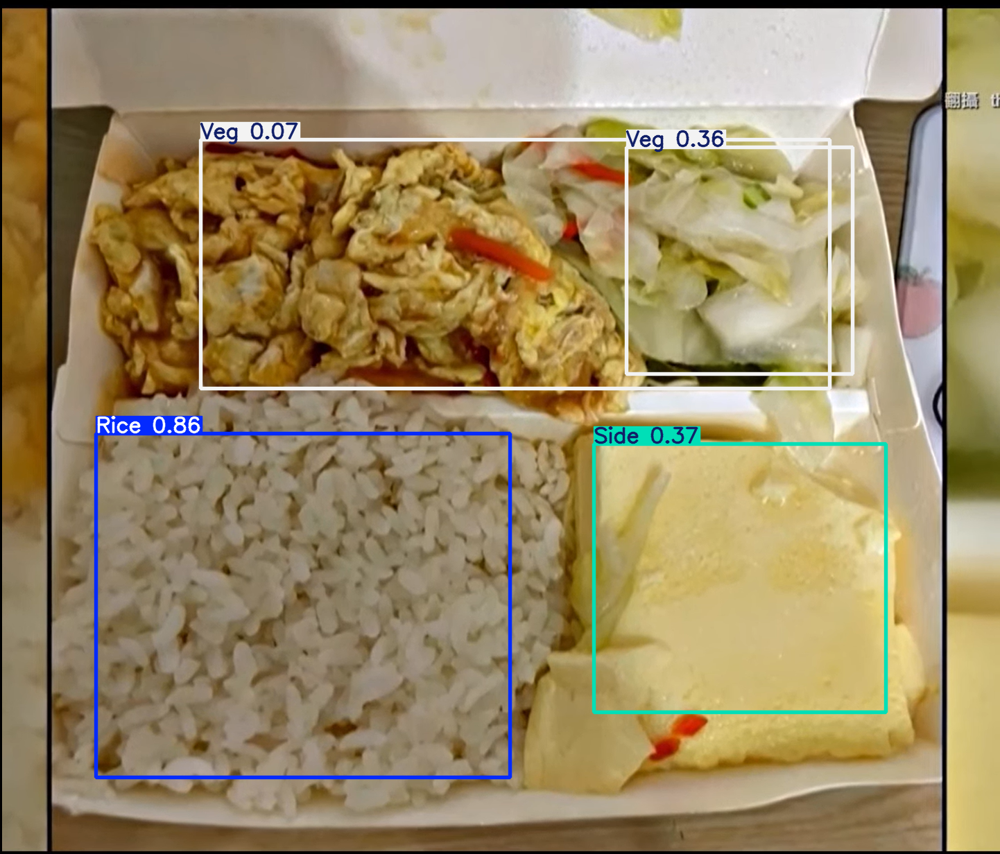

[8] food2.jpg


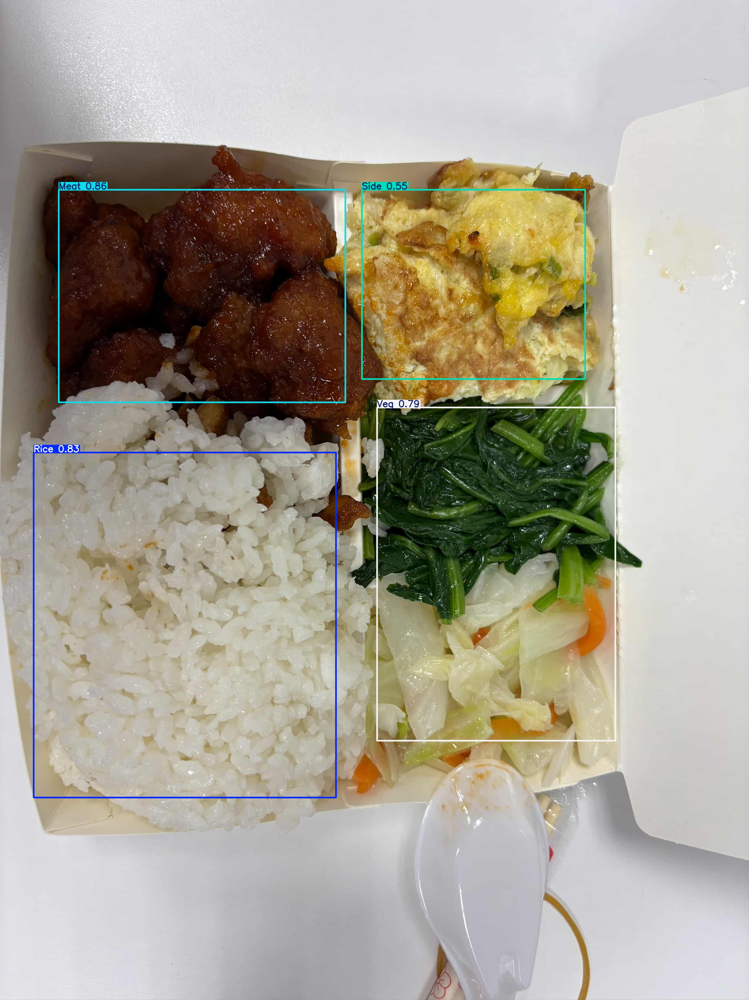

[9] food3.jpg


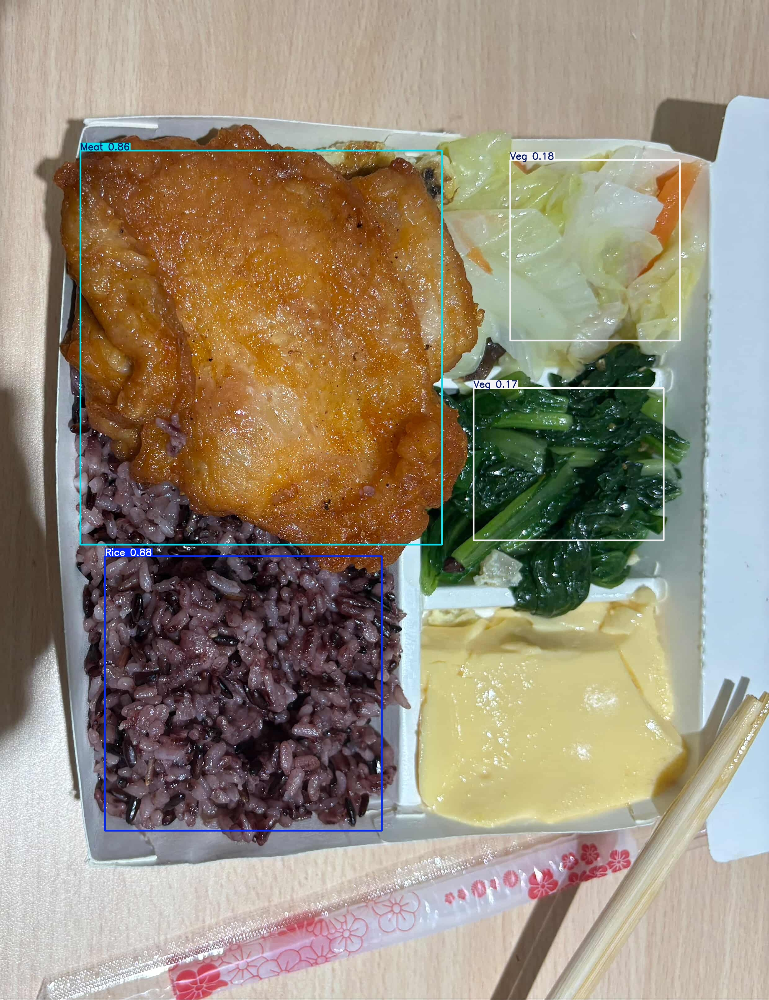

[10] food4.jpg


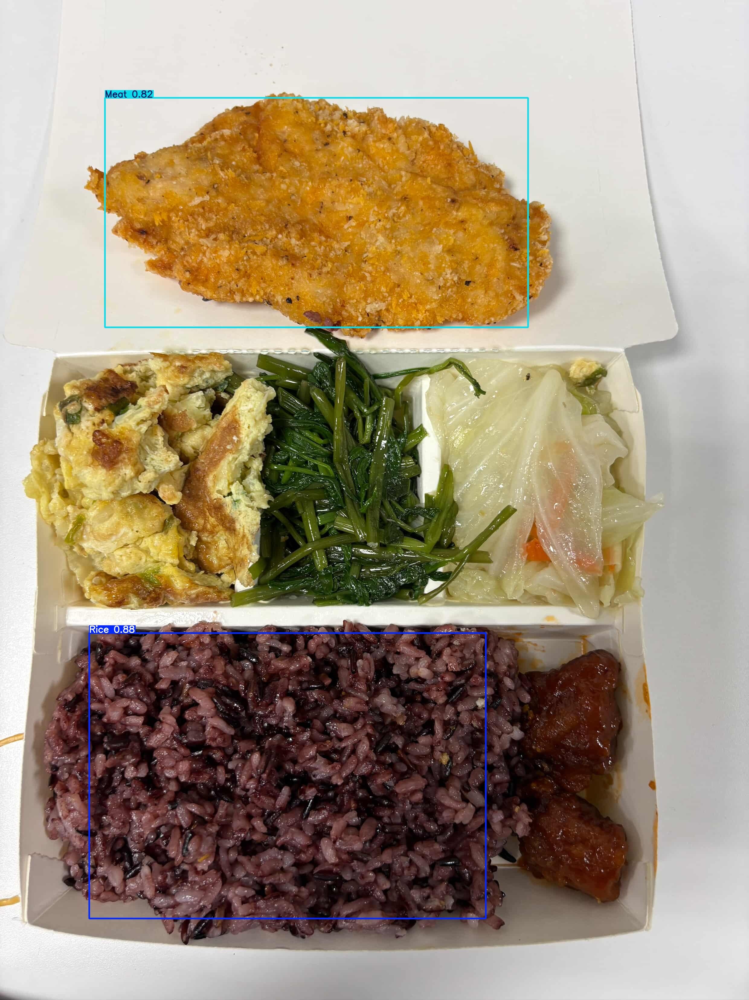

[11] food5.png


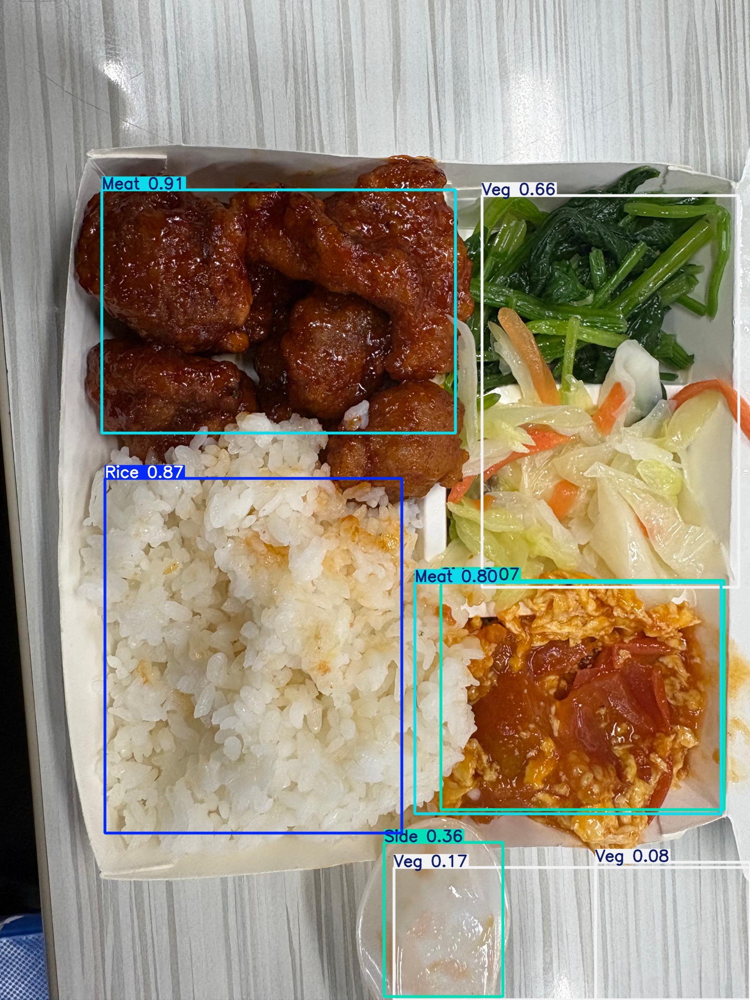

In [ ]:
# ==============================================================================
# 僅推論版 (Inference Only) - YOLOv5 原生相容模式
# 適用情境：解決 TypeError: BaseModel.fuse() 錯誤，使用原生 detect.py 執行
# ==============================================================================

import os
import sys
import subprocess
import glob
from IPython.display import Image, display

# ---------------------------------------------------------
# 1. 設定路徑
# ---------------------------------------------------------
# 請確保你的模型檔案名稱為 best.pt 並且位於左側檔案區最外層
model_filename = 'best.pt'
source_folder = 'pic'       # 待測圖片的資料夾名稱
project_name = 'runs/detect' # 結果存放的根目錄
exp_name = 'exp'            # 每次執行的資料夾名稱

# ---------------------------------------------------------
# 2. 環境準備 (自動下載 YOLOv5 原生程式碼)
# ---------------------------------------------------------
def run_command(command):
    try:
        subprocess.check_call(command, shell=True)
    except subprocess.CalledProcessError as e:
        print(f"指令執行失敗: {command}\n{e}")
        sys.exit(1)

if not os.path.exists("yolov5"):
    print("正在下載 YOLOv5 原生執行環境 (確保相容性)...")
    run_command("git clone https://github.com/ultralytics/yolov5")
    print("安裝相依套件...")
    run_command("pip install -r yolov5/requirements.txt")
else:
    print("檢測到 YOLOv5 環境已存在。")

# ---------------------------------------------------------
# 3. 執行預測
# ---------------------------------------------------------
# 檢查模型是否存在
if not os.path.exists(model_filename):
    print(f"錯誤：找不到模型檔案 '{model_filename}'")
    print("請確認你是否已將訓練好的 .pt 檔上傳到左側檔案區的最外層。")

# 檢查圖片資料夾是否存在
elif not os.path.exists(source_folder):
    print(f"錯誤：找不到資料夾 '{source_folder}'")
    print(f"請建立一個名為 '{source_folder}' 的資料夾，並放入你要測試的照片。")

else:
    print(f"開始執行預測 (使用 yolov5/detect.py)...")

    # 清理舊的預測結果 (選擇性，避免資料夾越來越多 exp1, exp2...)
    # import shutil
    # if os.path.exists(project_name):
    #     shutil.rmtree(project_name)

    # 組合偵測指令
    # --weights: 模型路徑
    # --source: 圖片資料夾
    # --conf: 信心門檻
    # --project: 存檔根目錄
    # --name: 存檔子目錄 (exist-ok 代表不一直新增 exp2, exp3)
    cmd = (
        f"python yolov5/detect.py "
        f"--weights {model_filename} "
        f"--source {source_folder} "
        f"--conf 0.05 "
        f"--project {project_name} "
        f"--name {exp_name} "
        f"--exist-ok"
    )

    run_command(cmd)

    # ---------------------------------------------------------
    # 4. 顯示結果
    # ---------------------------------------------------------
    result_dir = os.path.join(project_name, exp_name)

    print("-" * 30)
    print(f"偵測完成！")
    print(f"結果已儲存於：{result_dir}")
    print("-" * 30)

    # 抓取所有圖片檔案 (jpg, png, jpeg)
    result_images = []
    for ext in ['*.jpg', '*.jpeg', '*.png']:
        result_images.extend(glob.glob(os.path.join(result_dir, ext)))

    if len(result_images) > 0:
        print(f"\n--- 預覽結果 (共 {len(result_images)} 張) ---")
        result_images.sort()

        for i, img_path in enumerate(result_images):
            if i >= 100:
                print(f"...還有 {len(result_images) - 10} 張圖片未顯示，請至資料夾查看。")
                break

            file_name = os.path.basename(img_path)
            print(f"[{i+1}] {file_name}")
            try:
                # 修改：將顯示寬度從 400 改為 600，讓結果圖更大
                display(Image(filename=img_path, width=600))
            except Exception as e:
                print(f"無法顯示圖片: {e}")
    else:
        print("預測完成但找不到輸出的圖片，請檢查您的輸入資料夾是否為空，或模型是否未偵測到任何物件。")